<a href="https://colab.research.google.com/github/Noureqo1/Earthquake_Predictor_Probability/blob/main/Math105_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [ ]:
def scrape_earthquake_data():
    url = 'https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv'
    response = requests.get(url)
    if response.status_code == 200:
        data = pd.read_csv(url)
        return data
    else:
        print(f"Failed to retrieve data. Status code: {response.status_code}")
        return None

# Scrape earthquake data
earthquake_data = scrape_earthquake_data()

# Display the first few rows of the dataset
if earthquake_data is not None:
    print(earthquake_data.head())
else:
    print("No earthquake data retrieved.")

                       time   latitude   longitude  depth   mag magType   nst  \
0  2024-12-25T09:32:21.518Z  36.726400 -117.252100   3.70  1.40      ml  11.0   
1  2024-12-25T09:26:56.234Z  60.529700 -147.629600  15.90  2.20      ml   NaN   
2  2024-12-25T08:59:48.380Z  35.774833 -117.590167   5.59  0.96      ml  26.0   
3  2024-12-25T08:47:08.910Z  37.511002 -118.823830   3.96  1.63      md  20.0   
4  2024-12-25T08:37:49.740Z  33.541833 -116.721000   3.68  0.68      ml  17.0   

      gap     dmin     rms  ...                   updated  \
0  160.54  0.47900  0.2442  ...  2024-12-25T09:34:40.891Z   
1     NaN      NaN  0.5700  ...  2024-12-25T09:29:01.426Z   
2   60.00  0.13840  0.1800  ...  2024-12-25T09:08:34.692Z   
3  221.00  0.07900  0.0500  ...  2024-12-25T09:22:16.747Z   
4   75.00  0.02716  0.0900  ...  2024-12-25T08:41:56.521Z   

                                   place        type horizontalError  \
0  47 km NW of Furnace Creek, California  earthquake             NaN   
1 

In [ ]:
def preprocess_data(df):
    # Select relevant columns and rename them for consistency
    df = df[['time', 'latitude', 'longitude', 'depth', 'mag', 'place']].copy()
    df.columns = ['Time', 'Latitude', 'Longitude', 'Depth', 'Magnitude', 'Location']

    # Convert time to datetime
    df['Time'] = pd.to_datetime(df['Time'])

    # Extract additional features from the datetime column
    df['Year'] = df['Time'].dt.year
    df['Month'] = df['Time'].dt.month
    df['Day'] = df['Time'].dt.day
    df['Hour'] = df['Time'].dt.hour
    df['Minute'] = df['Time'].dt.minute
    df['Second'] = df['Time'].dt.second

    # Handle missing values if any
    df = df.dropna()

    return df

# Preprocess the data
processed_data = preprocess_data(earthquake_data)
print(processed_data.head())

                              Time   Latitude   Longitude  Depth  Magnitude  \
0 2024-12-25 09:32:21.518000+00:00  36.726400 -117.252100   3.70       1.40   
1 2024-12-25 09:26:56.234000+00:00  60.529700 -147.629600  15.90       2.20   
2 2024-12-25 08:59:48.380000+00:00  35.774833 -117.590167   5.59       0.96   
3 2024-12-25 08:47:08.910000+00:00  37.511002 -118.823830   3.96       1.63   
4 2024-12-25 08:37:49.740000+00:00  33.541833 -116.721000   3.68       0.68   

                                Location  Year  Month  Day  Hour  Minute  \
0  47 km NW of Furnace Creek, California  2024     12   25     9      32   
1           55 km NNE of Chenega, Alaska  2024     12   25     9      26   
2          17 km W of Searles Valley, CA  2024     12   25     8      59   
3            14 km WSW of Toms Place, CA  2024     12   25     8      47   
4                   5 km WSW of Anza, CA  2024     12   25     8      37   

   Second  
0      21  
1      56  
2      48  
3       8  
4      4

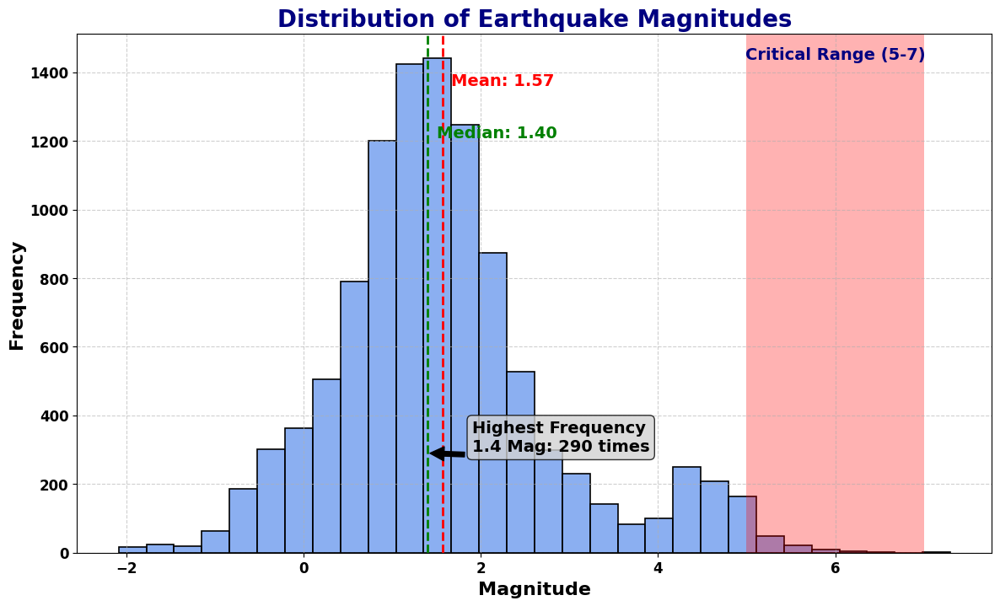

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_magnitude_distribution(df):
    plt.figure(figsize=(14, 8))

    # Create the histogram with KDE plot using blue hues
    sns.histplot(df['Magnitude'], bins=30, color='cornflowerblue', edgecolor='black', linewidth=1.2)

    # Add a vertical line at the mean magnitude
    mean_magnitude = df['Magnitude'].mean()
    plt.axvline(mean_magnitude, color='red', linestyle='--', linewidth=2)
    plt.text(mean_magnitude + 0.1, plt.ylim()[1] * 0.9, f'Mean: {mean_magnitude:.2f}', color='red', fontsize=14, fontweight='bold')

    # Add a vertical line at the median magnitude
    median_magnitude = df['Magnitude'].median()
    plt.axvline(median_magnitude, color='green', linestyle='--', linewidth=2)
    plt.text(median_magnitude + 0.1, plt.ylim()[1] * 0.8, f'Median: {median_magnitude:.2f}', color='green', fontsize=14, fontweight='bold')

    # Customizing the title and labels
    plt.title('Distribution of Earthquake Magnitudes', fontsize=20, fontweight='bold', color='navy')
    plt.xlabel('Magnitude', fontsize=16, fontweight='bold')
    plt.ylabel('Frequency', fontsize=16, fontweight='bold')

    # Customize the tick parameters
    plt.xticks(fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')

    # Add custom grid
    plt.grid(True, linestyle='--', alpha=0.6)

    # Highlight certain ranges with a shaded area
    plt.axvspan(5, 7, color='red', alpha=0.3, lw=0)
    plt.text(6, plt.ylim()[1] * 0.95, 'Critical Range (5-7)', color='navy', fontsize=14, fontweight='bold', ha='center')

    # Adding annotations for the highest frequency bin
    max_freq_bin = df['Magnitude'].value_counts().idxmax()
    max_freq_count = df['Magnitude'].value_counts().max()
    plt.annotate(f'Highest Frequency\n{max_freq_bin} Mag: {max_freq_count} times',
                 xy=(max_freq_bin, df['Magnitude'].value_counts()[max_freq_bin]),
                 xytext=(max_freq_bin + 0.5, df['Magnitude'].value_counts()[max_freq_bin] + 5),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=14, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgray", alpha=0.8))

    # Show the plot
    plt.show()

# Plot the enhanced magnitude distribution with blue hues
plot_magnitude_distribution(processed_data)

In [ ]:
import folium
from folium.plugins import MarkerCluster

def plot_enhanced_geo_map(df):
    # Initialize the map centered around the mean coordinates
    m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)

    # Create a marker cluster
    marker_cluster = MarkerCluster().add_to(m)

    # Add points to the map with color coding and informative popups
    for _, row in df.iterrows():
        magnitude = row['Magnitude']
        if magnitude < 3.0:
            color = 'blue'
        elif 3.0 <= magnitude < 5.0:
            color = 'green'
        elif 5.0 <= magnitude < 7.0:
            color = 'orange'
        else:
            color = 'red'

        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=5,
            popup=(
                f"Location: {row['Location']}<br>"
                f"Time: {row['Time']}<br>"
                f"Magnitude: {row['Magnitude']}<br>"
                f"Depth: {row['Depth']} km"
            ),
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7
        ).add_to(marker_cluster)

    return m

# Display the enhanced map
enhanced_earthquake_map = plot_enhanced_geo_map(processed_data)
enhanced_earthquake_map.save("enhanced_earthquake_map.html")
enhanced_earthquake_map

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [ ]:
def build_and_evaluate_model_with_smote(df):
    # Define the features and the target
    features = ['Latitude', 'Longitude', 'Depth', 'Year', 'Month', 'Day', 'Hour', 'Minute', 'Second']
    target = 'Magnitude'

    # Create a binary target for earthquake prediction (e.g., Magnitude >= 5.0)
    df['Target'] = (df['Magnitude'] >= 5.0).astype(int)

    X = df[features]
    y = df['Target']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Apply SMOTE to the training data
    smote = SMOTE(random_state=42)
    X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

    # Build and train the model
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train_res, y_train_res)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    return accuracy, report

# Build and evaluate the model with SMOTE
accuracy, report = build_and_evaluate_model_with_smote(processed_data)
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


Accuracy: 0.9704198473282443
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98      2070
           1       0.20      0.46      0.28        26

    accuracy                           0.97      2096
   macro avg       0.60      0.72      0.63      2096
weighted avg       0.98      0.97      0.98      2096

